# Analyzing 311

Thiru Satya Surya Mahaveer Bonagiri, Christian Deasis, Aryaan Upadhyay, Mary Choe

Analzing 311 Data - Team 3

Begin by extracting data:

In [2]:
# extracting data
import pandas as pd

df_2010 = pd.read_csv("dataverse_files/311 Cases 2010_2014 Unrestricted.csv")
df_2010.head()

,Unnamed: 0,TYPE,CASE_ENQUIRY_ID,CLOSED_DT,LOCATION,OPEN_DT,REASON,SOURCE,SUBJECT,LocationID,...,ObjectID,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM
0,179937,Electrical,101000102011,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Building,Constituent Call,Inspectional Services,303291000.0,...,NaN,0,0,0,0,0,0,0,0,0
1,180062,Electrical,101000101931,NaN,"4 Union Park St, Roxbury, MA 02118",2010-01-01,Building,Constituent Call,Inspectional Services,305963000.0,...,NaN,0,0,0,0,0,0,0,0,0
2,222060,Fire in Food Establishment,101000102010,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Health,Constituent Call,Inspectional Services,303291000.0,...,NaN,0,0,0,0,0,0,0,0,0
3,244491,General Comments For a Program or Policy,101000101966,2010-01-02,NaN,2010-01-01,Employee & General Comments,Constituent Call,Mayor's 24 Hour Hotline,NaN,...,NaN,0,0,0,0,0,0,0,0,0
4,259240,General Lighting Request,101000102004,2010-03-10,"INTERSECTION of Mount Vernon St & Walnut St, B...",2010-01-01,Street Lights,Constituent Call,Public Works Department,NaN,...,9411.0,1,0,0,0,0,0,0,0,0


In [3]:
df_2015 = pd.read_csv("dataverse_files/311 Cases 2015_2019 Unrestricted.csv")
df_2015.head()

,Unnamed: 0,TYPE,CASE_ENQUIRY_ID,CLOSED_DT,LOCATION,OPEN_DT,REASON,SOURCE,SUBJECT,LocationID,...,ObjectID,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM
0,45708,Animal Found,101001240881,NaN,"961 William T Morrissey Blvd, Dorchester, MA ...",2015-01-01,Animal Issues,Constituent Call,Animal Control,1.602538e+09,...,NaN,0,0,0,0,0,0,0,0,0
1,45887,Animal Found,101001240807,NaN,"27 Shepard St, Brighton, MA 02135",2015-01-01,Animal Issues,Constituent Call,Animal Control,2.205456e+09,...,NaN,0,0,0,0,0,0,0,0,0
2,46110,Animal Found,101001240873,NaN,"834-842 Morton St, Dorchester, MA 02124",2015-01-01,Animal Issues,Constituent Call,Animal Control,1.403860e+09,...,NaN,0,0,0,0,0,0,0,0,0
3,46395,Animal Found,101001240750,NaN,"730 Adams St, Dorchester, MA 02122",2015-01-01,Animal Issues,Constituent Call,Animal Control,1.603632e+09,...,NaN,0,0,0,0,0,0,0,0,0
4,46468,Animal Found,101001240740,NaN,"4833 Washington St, West Roxbury, MA 02132",2015-01-01,Animal Issues,Constituent Call,Animal Control,2.002788e+09,...,NaN,0,0,0,0,0,0,0,0,0


In [4]:
df_2020 = pd.read_csv("dataverse_files/311 Cases 2020_2024 Unrestricted.csv", low_memory=False)
df_2020.head()

,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT
0,101003148635,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.088920,42.344290,...,1,0,0,0,0,1,0,1,1,2020-03-12
1,101003148558,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.057980,42.282010,...,1,0,0,0,0,1,0,1,1,2020-01-13
2,101003148571,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"INTERSECTION of Milwood St & Gallivan Blvd, Do...",I11942,Mobile Request,-71.057802,42.282298,...,1,0,0,0,0,0,0,0,0,2020-01-13
3,101003148542,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.132410,42.235530,...,1,0,0,0,0,0,0,0,0,2020-01-18
4,101003148439,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.087270,42.310860,...,1,0,0,0,0,0,0,0,0,2020-01-02


Now that we have all three datasets that outline the time period desired, we will merge them into one dataset to perform our analysis. However, to make everything look cleaner and easier to comprehend, we will rearrange the order of the columns in the third dataset (df_2020) such that they match the order of the columns in the first two datasets (df_2010, df_2015), as they have the same column order.

In [5]:
# rearrange the order of columns in df_2020 to match df_2010 and df_2015

# get the common columns in all three dfs
common_columns = list(set(df_2010.columns).intersection(set(df_2015.columns)).intersection(set(df_2020.columns)))

# rearrange the columns of df_2020 to match the order in df_2010 and df_2015
df_2020 = df_2020[common_columns].reindex(columns=df_2010.columns)

df_2020.head()

,Unnamed: 0,TYPE,CASE_ENQUIRY_ID,CLOSED_DT,LOCATION,OPEN_DT,REASON,SOURCE,SUBJECT,LocationID,...,ObjectID,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM
0,NaN,Abandoned Bicycle,101003148635,2020-03-12,"70 Burbank St, Boston, MA 02115",2020-01-01,Abandoned Bicycle,Mobile Request,Mayor's 24 Hour Hotline,4.014760e+08,...,NaN,1,0,0,0,0,1,0,1,1
1,NaN,Abandoned Bicycle,101003148558,2020-01-13,"461 Gallivan Blvd, Dorchester, MA 02124",2020-01-01,Abandoned Bicycle,Constituent Call,Mayor's 24 Hour Hotline,1.605083e+09,...,NaN,1,0,0,0,0,1,0,1,1
2,NaN,Abandoned Vehicles,101003148571,2020-01-13,"INTERSECTION of Milwood St & Gallivan Blvd, Do...",2020-01-01,Enforcement & Abandoned Vehicles,Mobile Request,Transportation - Traffic Division,NaN,...,6769.0,1,0,0,0,0,0,0,0,0
3,NaN,Abandoned Vehicles,101003148542,2020-01-18,"10 Stanbro St, Hyde Park, MA 02136",2020-01-01,Enforcement & Abandoned Vehicles,Mobile Request,Transportation - Traffic Division,1.809755e+09,...,NaN,1,0,0,0,0,0,0,0,0
4,NaN,Abandoned Vehicles,101003148439,2020-01-02,"8 Pleasanton St, Dorchester, MA 02121",2020-01-01,Enforcement & Abandoned Vehicles,Mobile Request,Transportation - Traffic Division,1.202261e+09,...,NaN,1,0,0,0,0,0,0,0,0


Now that the column orders are the same, we can merge all three datasets into one dataframe.

In [6]:
# merge all 3 datasets
df = pd.concat([df_2010, df_2015, df_2020])

df.head()

,Unnamed: 0,TYPE,CASE_ENQUIRY_ID,CLOSED_DT,LOCATION,OPEN_DT,REASON,SOURCE,SUBJECT,LocationID,...,ObjectID,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM
0,179937.0,Electrical,101000102011,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Building,Constituent Call,Inspectional Services,303291000.0,...,NaN,0,0,0,0,0,0,0,0,0
1,180062.0,Electrical,101000101931,NaN,"4 Union Park St, Roxbury, MA 02118",2010-01-01,Building,Constituent Call,Inspectional Services,305963000.0,...,NaN,0,0,0,0,0,0,0,0,0
2,222060.0,Fire in Food Establishment,101000102010,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Health,Constituent Call,Inspectional Services,303291000.0,...,NaN,0,0,0,0,0,0,0,0,0
3,244491.0,General Comments For a Program or Policy,101000101966,2010-01-02,NaN,2010-01-01,Employee & General Comments,Constituent Call,Mayor's 24 Hour Hotline,NaN,...,NaN,0,0,0,0,0,0,0,0,0
4,259240.0,General Lighting Request,101000102004,2010-03-10,"INTERSECTION of Mount Vernon St & Walnut St, B...",2010-01-01,Street Lights,Constituent Call,Public Works Department,NaN,...,9411.0,1,0,0,0,0,0,0,0,0


In [7]:
#import os
#df.to_csv("merged_df.csv", index=False)

In [8]:
# check size (sanity check)
df.size

79496928

In [9]:
# list all columns in df (sanity check)
column_names = list(df)

print(column_names)

['Unnamed: 0', 'TYPE', 'CASE_ENQUIRY_ID', 'CLOSED_DT', 'LOCATION', 'OPEN_DT', 'REASON', 'SOURCE', 'SUBJECT', 'LocationID', 'X', 'Y', 'TLID', 'BLK_ID_10', 'BG_ID_10', 'CT_ID_10', 'NSA_NAME', 'BRA_PD', 'ObjectID', 'PUBLIC', 'HOUSING', 'UNCIVILUSE', 'BIGBUILD', 'GRAFFITI', 'TRASH', 'PRIVATENEGLECT', 'PUBLICDENIG', 'PROBLEM']


We want to examine the data in which there is no Closed Date, or cases that have not been addressed. We will now extract this data to further examine.

In [10]:
# retrieve rows that have NaN value for CLOSED_DT
# first create copy of main dataframe
df2 = df.copy()

df2.head()

,Unnamed: 0,TYPE,CASE_ENQUIRY_ID,CLOSED_DT,LOCATION,OPEN_DT,REASON,SOURCE,SUBJECT,LocationID,...,ObjectID,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM
0,179937.0,Electrical,101000102011,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Building,Constituent Call,Inspectional Services,303291000.0,...,NaN,0,0,0,0,0,0,0,0,0
1,180062.0,Electrical,101000101931,NaN,"4 Union Park St, Roxbury, MA 02118",2010-01-01,Building,Constituent Call,Inspectional Services,305963000.0,...,NaN,0,0,0,0,0,0,0,0,0
2,222060.0,Fire in Food Establishment,101000102010,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Health,Constituent Call,Inspectional Services,303291000.0,...,NaN,0,0,0,0,0,0,0,0,0
3,244491.0,General Comments For a Program or Policy,101000101966,2010-01-02,NaN,2010-01-01,Employee & General Comments,Constituent Call,Mayor's 24 Hour Hotline,NaN,...,NaN,0,0,0,0,0,0,0,0,0
4,259240.0,General Lighting Request,101000102004,2010-03-10,"INTERSECTION of Mount Vernon St & Walnut St, B...",2010-01-01,Street Lights,Constituent Call,Public Works Department,NaN,...,9411.0,1,0,0,0,0,0,0,0,0


In [11]:
# get rows with NaN for column CLOSED_DT
df2 = df2[df2['CLOSED_DT'].isnull()]

df2.head()

,Unnamed: 0,TYPE,CASE_ENQUIRY_ID,CLOSED_DT,LOCATION,OPEN_DT,REASON,SOURCE,SUBJECT,LocationID,...,ObjectID,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM
0,179937.0,Electrical,101000102011,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Building,Constituent Call,Inspectional Services,3.032910e+08,...,NaN,0,0,0,0,0,0,0,0,0
1,180062.0,Electrical,101000101931,NaN,"4 Union Park St, Roxbury, MA 02118",2010-01-01,Building,Constituent Call,Inspectional Services,3.059630e+08,...,NaN,0,0,0,0,0,0,0,0,0
2,222060.0,Fire in Food Establishment,101000102010,NaN,"227 Hanover St, Boston, MA 02113",2010-01-01,Health,Constituent Call,Inspectional Services,3.032910e+08,...,NaN,0,0,0,0,0,0,0,0,0
8,271420.0,General Request,101000101964,NaN,"560-574 Commonwealth Ave, Boston, MA 02215",2010-01-01,General Request,Mobile Request,Mayor's 24 Hour Hotline,NaN,...,NaN,0,0,0,0,0,0,0,0,0
14,271461.0,General Request,101000101941,NaN,"43 Winston Rd, Dorchester, MA 02124",2010-01-01,General Request,Constituent Call,Mayor's 24 Hour Hotline,1.403538e+09,...,NaN,0,0,0,0,0,0,0,0,0


In [12]:
# check size (sanity check)
df2.size

9161796

In [13]:
# list columns of df2 (sanity check)
column_names2 = list(df2)

print(column_names2)

['Unnamed: 0', 'TYPE', 'CASE_ENQUIRY_ID', 'CLOSED_DT', 'LOCATION', 'OPEN_DT', 'REASON', 'SOURCE', 'SUBJECT', 'LocationID', 'X', 'Y', 'TLID', 'BLK_ID_10', 'BG_ID_10', 'CT_ID_10', 'NSA_NAME', 'BRA_PD', 'ObjectID', 'PUBLIC', 'HOUSING', 'UNCIVILUSE', 'BIGBUILD', 'GRAFFITI', 'TRASH', 'PRIVATENEGLECT', 'PUBLICDENIG', 'PROBLEM']


In [14]:
# check how many different types of cases exist (sanity check)
pd.value_counts(df2.TYPE)
#df2['TYPE'].unique() - another way to do this (returns longer output)

General Request                             144532
Request for Pothole Repair                   13980
Unsatisfactory Living Conditions             13917
Animal Generic Request                       13568
General Comments For a Program or Policy     13138
                                             ...  
No Price on Gas/Wrong Price                      1
Metrolist Demographic Survey                     1
Special Request                                  1
Summer Jobs Age 14 Plus                          1
News Boxes                                       1
Name: TYPE, Length: 210, dtype: int64

We will now create a bar graph to show the types of cases that these unresolved calls fall into.

NOTE: there are many case types, so the graph, for now, looks very messy. (will fix this later)

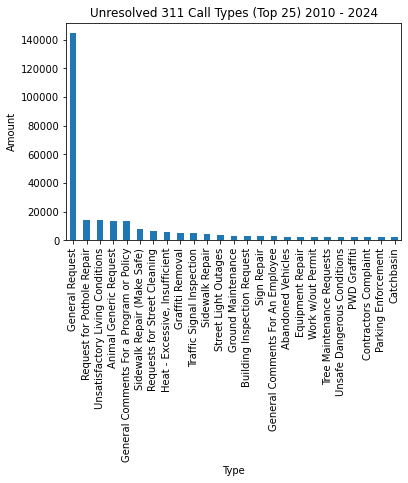

In [15]:
import numpy as np
import matplotlib.pyplot as plt

#df2['TYPE'].value_counts().plot(kind = 'bar')
top_types = df2['TYPE'].value_counts().sort_values(ascending=False)[:25]
top_types.plot(kind='bar')

plt.title('Unresolved 311 Call Types (Top 25) 2010 - 2024')
plt.xlabel('Type')
plt.ylabel('Amount') # change title later

# Display the graph
plt.show()

#KEEP THIS FOR NOW, IM STILL NOT SURE WHAT TIMEFRAME WE WANT TO LOOK AT

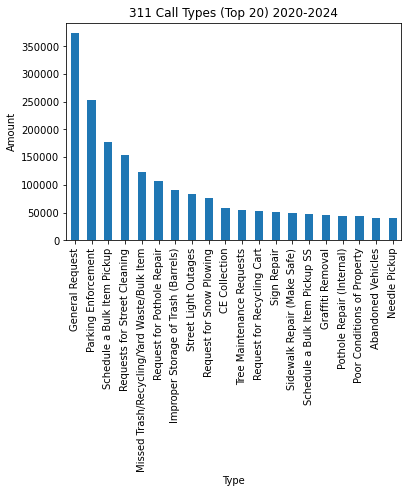

In [22]:
# using df_2020 dataset:
top_types = df['TYPE'].value_counts().sort_values(ascending=False)[:20]
top_types.plot(kind='bar')

plt.title('311 Call Types (Top 20) 2020-2024')
plt.xlabel('Type')
plt.ylabel('Amount') # change title later

# Display the graph
plt.show()

Now we will display these onto a map for better visualization.

In [17]:
from folium import plugins, Map
from folium.plugins import HeatMap
import folium

# Heatmap for Poor Conditions of Property (first 100)
base_map = Map()
df_2020_map = df_2020[(df_2020['TYPE'] == 'Poor Conditions of Property')]

df_2020_map['X'] = df_2020_map['X'].astype(float)
df_2020_map['Y'] = df_2020_map['Y'].astype(float)
df_2020_map = df_2020_map.dropna(subset=['X', 'Y'])

for i in range(len(df_2020_map)):
    folium.Circle(
        location=[df_2020_map['Y'].values[i], df_2020_map['X'].values[i]],
        radius = 10
    ).add_to(base_map)

base_map.save('Map of Poor Conditions of Property.html')
base_map

/var/folders/6y/d5n5pyks3jgckwfhjgjkfy240000gn/T/ipykernel_1896/687200293.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2020_map['X'] = df_2020_map['X'].astype(float)
/var/folders/6y/d5n5pyks3jgckwfhjgjkfy240000gn/T/ipykernel_1896/687200293.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2020_map['Y'] = df_2020_map['Y'].astype(float)


In [18]:
#!pip3 install geopy

In [19]:
# DONT NEED THIS I DONT THINK BUT IM GOING TO KEEP IT FOR NOW 
# create heatmap
# first based off of location ID, use a geocoding API to convert into latitude and longitude for the addresses
# keep in mind this takes forever
#import geopy
#from geopy.geocoders import Nominatim

# create a geolocator object using the Nominatim API
#geolocator = Nominatim(user_agent="my_app")

# define a function to geocode an address and return the latitude and longitude
#def geocode(address):
#    location = geolocator.geocode(address)
#    if location:
#        return location.latitude, location.longitude
#    else:
#        return None, None

# Apply the geocode function to the location IDs in the merged dataframe
#df2['latitude'], df2['longitude'] = zip(*df2['LocationID'].apply(geocode))

print(top_types.columns)

AttributeError: 'Series' object has no attribute 'columns'

In [ ]:
# create heatmap
import folium
from folium import plugins, Map
from folium.plugins import HeatMap

# map centered on Boston
boston = [42.3601, -71.0589]
heatmap_map = folium.Map(location = boston, zoom_start=12)

# HeatMap object using the location data
#location_df = df2.dropna(subset=['latitude', 'longitude'])
#heatmap_data = location_df[['latitude', 'longitude']].values.tolist()
#heatmap = folium.plugins.HeatMap(heatmap_data, radius=15, max_val=1, blur=20)
df['Y'] = df['Y'].astype(float)
df['X'] = df['X'].astype(float)
heat_data = [[row['Y'], row['X']] for index, row in df_2020.iterrows()]
HeatMap(heat_data).add_to(heatmap_map)

# add the HeatMap layer to the map
#heatmap.add_to(heatmap_map)

# display the map (save to html) - think of better file name later
heatmap_map.save('heatmap.html')

KeyboardInterrupt: 

In [ ]:
data_2020 = pd.read_csv("dataverse_files/311 Cases 2020_2024 Unrestricted.csv")
data_2020.head()

/Users/marychoe/Library/Python/3.10/lib/python/site-packages/IPython/core/interactiveshell.py:3442: DtypeWarning: Columns (16,17) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,PUBLIC,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT
0,101003148635,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.088920,42.344290,...,1,0,0,0,0,1,0,1,1,2020-03-12
1,101003148558,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.057980,42.282010,...,1,0,0,0,0,1,0,1,1,2020-01-13
2,101003148571,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"INTERSECTION of Milwood St & Gallivan Blvd, Do...",I11942,Mobile Request,-71.057802,42.282298,...,1,0,0,0,0,0,0,0,0,2020-01-13
3,101003148542,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.132410,42.235530,...,1,0,0,0,0,0,0,0,0,2020-01-18
4,101003148439,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.087270,42.310860,...,1,0,0,0,0,0,0,0,0,2020-01-02


In [ ]:
data_2020["splitted"] = data_2020["LOCATION"].str.split(' ', expand = True)
#zip_codes = splitted[4].filterna(' ')
#print(data_2020["splitted"])



ValueError: Wrong number of items passed 18, placement implies 1

In [93]:
import pandas as pd

gr = pd.read_csv("gr_0.csv")

gr_mr = len(gr)
gr_ref = []
for i in range(gr_mr-1):
    id = gr.values[i][0]
    block = gr.values[i][11]
    gr_ref.append([id, block])
# print(gr_ref)

[['101003150529', 5002.0], ['101003151859', 2003.0], ['101003149540', 1002.0], ['101003149541', 1001.0], ['101003149542', 1003.0], ['101003149543', 2006.0], ['101003149533', nan], ['101003150522', 1001.0], ['101003151854', 1007.0], ['101003149534', nan], ['101003150523', 1002.0], ['101003151853', 1053.0], ['101003149535', nan], ['101003150520', nan], ['101003151852', 4000.0], ['101003149536', 2002.0], ['101003151851', 1005.0], ['101003149537', 1002.0], ['101003150526', 2006.0], ['101003151858', 4000.0], ['101003149538', 2001.0], ['101003150527', nan], ['101003151857', nan], ['101003149539', 2003.0], ['101003150524', nan], ['101003151856', 3001.0], ['101003151855', 1006.0], ['101003151850', nan], ['101003150519', 1001.0], ['101003150517', 1005.0], ['101003151849', 2006.0], ['101003150518', 1002.0], ['101003151848', 1000.0], ['101003149530', 4000.0], ['101003149531', 1003.0], ['101003149532', 1004.0], ['101003149522', 3003.0], ['101003150511', 1015.0], ['101003151843', nan], ['1010031495

In [94]:
df = pd.read_csv("311 Cases 2020_2024 Unrestricted.csv")
df = df.head(10000)
df['CASE_ENQUIRY_ID'] = df['CASE_ENQUIRY_ID'].astype(str)
df["BLOCK_ID"] = ''
df.head()

/Users/marychoe/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (16,17) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,BLOCK_ID
0,101003148635,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.088920,42.344290,...,0,0,0,0,1,0,1,1,2020-03-12,
1,101003148558,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.057980,42.282010,...,0,0,0,0,1,0,1,1,2020-01-13,
2,101003148571,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"INTERSECTION of Milwood St & Gallivan Blvd, Do...",I11942,Mobile Request,-71.057802,42.282298,...,0,0,0,0,0,0,0,0,2020-01-13,
3,101003148542,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.132410,42.235530,...,0,0,0,0,0,0,0,0,2020-01-18,
4,101003148439,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.087270,42.310860,...,0,0,0,0,0,0,0,0,2020-01-02,


In [95]:
for i in range(1, len(df)):
    id = df.values[i][0]
    for arr in gr_ref:
        if id in arr:
            df.at[i, 'BLOCK_ID'] = arr[1]
            break  
df_0 = df
df.head()

,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,HOUSING,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,BLOCK_ID
0,101003148635,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.088920,42.344290,...,0,0,0,0,1,0,1,1,2020-03-12,
1,101003148558,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.057980,42.282010,...,0,0,0,0,1,0,1,1,2020-01-13,5005.0
2,101003148571,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"INTERSECTION of Milwood St & Gallivan Blvd, Do...",I11942,Mobile Request,-71.057802,42.282298,...,0,0,0,0,0,0,0,0,2020-01-13,NaN
3,101003148542,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.132410,42.235530,...,0,0,0,0,0,0,0,0,2020-01-18,2018.0
4,101003148439,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.087270,42.310860,...,0,0,0,0,0,0,0,0,2020-01-02,3006.0


In [96]:
gr = pd.read_csv("gr_1.csv")
gr.head()

gr_mr = len(gr)
for i in range(gr_mr-1):
    id = gr.values[i][0]
    block = gr.values[i][11]
    gr_ref.append([id, block])
# print(gr_ref)

df = pd.read_csv("311 Cases 2020_2024 Unrestricted.csv")
df = df.loc[10000:20000]
df['CASE_ENQUIRY_ID'] = df['CASE_ENQUIRY_ID'].astype(str)
df["Block Id"] = ''

for i in range(1, len(df)):
    id = df.values[i][0]
    for arr in gr_ref:
        if id in arr:
            df.at[i, 27] = arr[1]
            break  
df_1 = df
df.head(10)

[['101003150529', 5002.0], ['101003151859', 2003.0], ['101003149540', 1002.0], ['101003149541', 1001.0], ['101003149542', 1003.0], ['101003149543', 2006.0], ['101003149533', nan], ['101003150522', 1001.0], ['101003151854', 1007.0], ['101003149534', nan], ['101003150523', 1002.0], ['101003151853', 1053.0], ['101003149535', nan], ['101003150520', nan], ['101003151852', 4000.0], ['101003149536', 2002.0], ['101003151851', 1005.0], ['101003149537', 1002.0], ['101003150526', 2006.0], ['101003151858', 4000.0], ['101003149538', 2001.0], ['101003150527', nan], ['101003151857', nan], ['101003149539', 2003.0], ['101003150524', nan], ['101003151856', 3001.0], ['101003151855', 1006.0], ['101003151850', nan], ['101003150519', 1001.0], ['101003150517', 1005.0], ['101003151849', 2006.0], ['101003150518', 1002.0], ['101003151848', 1000.0], ['101003149530', 4000.0], ['101003149531', 1003.0], ['101003149532', 1004.0], ['101003149522', 3003.0], ['101003150511', 1015.0], ['101003151843', nan], ['1010031495

/Users/marychoe/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (16,17) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,Block Id,27
10000,101003159808,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"201 S Huntington Ave, Jamaica Plain, MA 02130",A76646,Mobile Request,-71.11242,42.325670,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-15,,NaN
10001,101003158975,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"108 Chittick Rd, Hyde Park, MA 02136",A207797,City Worker App,-71.12087,42.245370,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN
10002,101003159503,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"9-11 Lawrence Pl, Brighton, MA 02135",A84568,Mobile Request,-71.14884,42.355220,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-15,,NaN
10003,101003159433,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"INTERSECTION of Dana Ave & Hyde Park Ave, Hyde...",I18118,Constituent Call,-71.12438,42.253964,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN
10004,101003158993,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"63 Morris St, East Boston, MA 02128",A277609,Mobile Request,-71.03226,42.376150,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN
10005,101003158920,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"92 W Springfield St, Roxbury, MA 02118",A130036,Mobile Request,-71.07708,42.337370,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN
10006,101003159095,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"151 Townsend St, Dorchester, MA 02121",A136460,Constituent Call,-71.08820,42.317380,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN
10007,101003158893,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"30 Mansfield St, Allston, MA 02134",A167317,Mobile Request,-71.13135,42.358010,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN
10008,101003158913,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"7 Palmer St, Roxbury, MA 02119",A354453,Constituent Call,-71.08278,42.330350,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,,NaN
10009,101003158889,2020-01-14,Public Works Department,Street Cleaning,Requests for Street Cleaning,"16 Ripley Rd, Dorchester, MA 02121",A116114,Mobile Request,-71.07636,42.298920,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-01-14,,NaN


In [36]:
import pandas as pd

df_2020 = pd.read_csv("dataverse_files/311 Cases 2020_2024 Unrestricted.csv", low_memory=False)
# df_2020.head()

df_closure_types = pd.read_csv("dataverse_files/BOS311.csv", low_memory=False)

df_blocks = pd.read_csv("block_data.csv", low_memory=False)
df_blocks.head()


,CASE_ENQUIRY_ID,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,BLOCK_ID
0,101003150528.00,"52 Westland Ave, Boston, MA, 02115",Match,Exact,"52 WESTLAND AVE, BOSTON, MA, 02115","-71.08804414599996,42.343618235000065",85733011.0,L,25.0,25.0,10404.0,3000.0
1,101003150529.00,"552 Beech St, Roslindale, MA, 02131",Match,Exact,"552 BEECH ST, ROSLINDALE, MA, 02131","-71.13037666699995,42.27412014300006",85703666.0,L,25.0,25.0,110403.0,5002.0
2,101003151859.00,"51 Redlands Rd, West Roxbury, MA, 02132",Match,Exact,"51 REDLANDS RD, WEST ROXBURY, MA, 02132","-71.15217810199994,42.28889386600008",85702739.0,R,25.0,25.0,130200.0,2003.0
3,101003149540.00,"105 Buttonwood St, Dorchester, MA, 02125",Match,Exact,"105 BUTTONWOOD ST, DORCHESTER, MA, 02125","-71.05587282899995,42.322503776000076",85712586.0,R,25.0,25.0,90700.0,1002.0
4,101003149541.00,"7 Iroquois St, Mission Hill, MA, 02120",Match,Exact,"7 IROQUOIS ST, MISSION HILL, MA, 02120","-71.10314878499997,42.329842892000045",645436818.0,R,25.0,25.0,81001.0,1001.0


In [103]:
import pandas as pd

df_2020 = pd.read_csv("311 Cases with Closure Type and Blocks.csv", low_memory=False)

df_blocks = pd.read_csv("block_data.csv", low_memory=False)
df_2020.head()

,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,CLOSURE_REASON,BLOCK_ID
0,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.08892,42.34429,...,0,0,0,1,0,1,1,3/12/20,Case Noted. There was no bike at that location...,1002
1,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.05798,42.28201,...,0,0,0,1,0,1,1,1/13/20,Case Noted. The bike was not found at this loc...,5005
2,1.010030e+11,1/1/20,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.13241,42.23553,...,0,0,0,0,0,0,0,1/18/20,Case Noted. Please resubmit with vehicle plate...,2018
3,1.010030e+11,1/1/20,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.08727,42.31086,...,0,0,0,0,0,0,0,1/2/20,Duplicate of Existing Case. Duplicate of 10100...,3006
4,1.010030e+11,1/1/20,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"1857 Hyde Park Ave, Hyde Park, MA 02136",A77234,Mobile Request,-71.13287,42.23573,...,0,0,0,0,0,0,0,1/16/20,Case Resolved. Vehicle not at location.,2010


In [12]:
df_blocks = df_blocks[['CASE_ENQUIRY_ID','BLOCK_ID']].copy()
df_blocks = df_blocks.dropna()
df_blocks['CASE_ENQUIRY_ID'] = df_blocks['CASE_ENQUIRY_ID'].astype('int64')
print(type(df_blocks.iloc[4]['CASE_ENQUIRY_ID']))
df_2020 = pd.merge(df_2020, df_blocks, on='CASE_ENQUIRY_ID')
# df_blocks.head()
df_2020.head()


<class 'numpy.float64'>


,Unnamed: 0,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,...,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,CLOSURE_REASON,BLOCK_ID
0,0,101003148635,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.08892,...,0,0,0,1,0,1,1,2020-03-12,Case Noted. There was no bike at that location...,1002.0
1,1,101003148558,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.05798,...,0,0,0,1,0,1,1,2020-01-13,Case Noted. The bike was not found at this loc...,5005.0
2,2,101003148542,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.13241,...,0,0,0,0,0,0,0,2020-01-18,Case Noted. Please resubmit with vehicle plate...,2018.0
3,3,101003148439,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.08727,...,0,0,0,0,0,0,0,2020-01-02,Duplicate of Existing Case. Duplicate of 10100...,3006.0
4,4,101003148541,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"1857 Hyde Park Ave, Hyde Park, MA 02136",A77234,Mobile Request,-71.13287,...,0,0,0,0,0,0,0,2020-01-16,Case Resolved. Vehicle not at location.,2010.0


In [13]:
df_2020.to_csv('311 Cases with Closure Type and Blocks.csv')

In [ ]:
df_closure_types = df_closure_types[['CASE_ENQUIRY_ID','CLOSURE_REASON']].copy()
# df_2020 = pd.merge(df_2020, df_closure_types, on='CASE_ENQUIRY_ID')
# print(type(df_blocks['CASE_ENQUIRY_ID']))

In [2]:
block_ref = []
for i in range(len(df_blocks.index)):
    case_id = df_blocks.iloc[i]['CASE_ENQUIRY_ID']
    block_id = df_blocks.iloc[i]['BLOCK_ID']
    block_ref.append([case_id, block_id])
print(block_ref[15020])


['1.01E+11', 1004.0]


In [4]:
for i in range(len(df_2020.index)):
    case_id = df_2020.iloc[i]['CASE_ENQUIRY_ID']
    for ref in block_ref:
        if ref[0] == case_id:
            df_2020[i]['BLOCK_ID'] = ref[1]
            break
df_2020.head()

In [17]:
df_2020.to_csv('UPDATED 311 Cases with Closure Type.csv')

In [18]:
df_2020 = pd.merge(df_2020, df_blocks, on='CASE_ENQUIRY_ID')

ValueError: You are trying to merge on int64 and object columns. If you wish to proceed you should use pd.concat

In [3]:
closure_type_ref = []
for i in range(len(df_closure_types.index)):
    case_id = df_closure_types.iloc[i]['CASE_ENQUIRY_ID']
    closure_type_id = df_closure_types.iloc[i]['CLOSURE_REASON']
    closure_type_ref.append([case_id, closure_type_id])
print(closure_type_ref[15040])

[101003000000.0, 'Case Referred to External Agency. Brookline.']


In [ ]:
for i in range(len(df_2020.index)):
    case_id = df_2020.iloc[i]['CASE_ENQUIRY_ID']
    for ref in block_ref:
        if ref[0] == case_id:
            df_2020[i]['CLOSURE_TYPE'] = ref[1]
            break
df_2020.head()

In [98]:
df_2020.to_csv('311 Cases with Closure Types and Blocks.csv')

In [15]:
df = df_2020
df.head()

,Unnamed: 0,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,...,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,CLOSURE_REASON,BLOCK_ID
0,0,101003148635,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.08892,...,0,0,0,1,0,1,1,2020-03-12,Case Noted. There was no bike at that location...,1002.0
1,1,101003148558,2020-01-01,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.05798,...,0,0,0,1,0,1,1,2020-01-13,Case Noted. The bike was not found at this loc...,5005.0
2,2,101003148542,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.13241,...,0,0,0,0,0,0,0,2020-01-18,Case Noted. Please resubmit with vehicle plate...,2018.0
3,3,101003148439,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.08727,...,0,0,0,0,0,0,0,2020-01-02,Duplicate of Existing Case. Duplicate of 10100...,3006.0
4,4,101003148541,2020-01-01,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"1857 Hyde Park Ave, Hyde Park, MA 02136",A77234,Mobile Request,-71.13287,...,0,0,0,0,0,0,0,2020-01-16,Case Resolved. Vehicle not at location.,2010.0


In [44]:
import pandas as pd

df = pd.read_csv("311 Cases with Closure Type and Blocks.csv", low_memory=False)
df.head()


,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,UNCIVILUSE,BIGBUILD,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,CLOSURE_REASON,BLOCK_ID
0,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.08892,42.34429,...,0,0,0,1,0,1,1,3/12/20,Case Noted. There was no bike at that location...,1002
1,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"461 Gallivan Blvd, Dorchester, MA 02124",A62325,Constituent Call,-71.05798,42.28201,...,0,0,0,1,0,1,1,1/13/20,Case Noted. The bike was not found at this loc...,5005
2,1.010030e+11,1/1/20,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"10 Stanbro St, Hyde Park, MA 02136",A130087,Mobile Request,-71.13241,42.23553,...,0,0,0,0,0,0,0,1/18/20,Case Noted. Please resubmit with vehicle plate...,2018
3,1.010030e+11,1/1/20,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"8 Pleasanton St, Dorchester, MA 02121",A111359,Mobile Request,-71.08727,42.31086,...,0,0,0,0,0,0,0,1/2/20,Duplicate of Existing Case. Duplicate of 10100...,3006
4,1.010030e+11,1/1/20,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,Abandoned Vehicles,"1857 Hyde Park Ave, Hyde Park, MA 02136",A77234,Mobile Request,-71.13287,42.23573,...,0,0,0,0,0,0,0,1/16/20,Case Resolved. Vehicle not at location.,2010


In [94]:
df_lep = pd.read_csv("Climate_Ready_Boston_Social_Vulnerability.csv", low_memory=False)
df_lep.head()

,FID,CT_ID_10,AREA_SQFT,AREA_ACRES,POP100_RE,HU100_RE,TotDis,TotChild,OlderAdult,Low_to_No,LEP,POC2,MedIllnes,Name,Shape__Area,Shape__Length
0,1,25025010405,3914567.54,89.8661,5522,994,470,60,331,1191,1522,1755,2131.22,Mission Hill,666100.0000,6036.192907
1,2,25025010404,1472713.92,33.8089,5817,1862,299,77,56,2387,2443,1749,2201.14,Fenway,250612.3828,2176.592171
2,3,25025010801,1376667.12,31.6039,2783,1899,84,281,390,72,462,447,1214.76,Back Bay,234357.9102,2542.043078
3,4,25025010702,3228780.12,74.1226,2400,1643,45,86,285,187,472,320,1014.20,Back Bay,549614.0078,3224.573044
4,5,25025010204,2741497.18,62.9361,3173,1283,131,13,36,895,931,1039,1181.78,Fenway,466585.2383,3143.610637


In [104]:
df_lep = df_lep[['CT_ID_10','POP100_RE','LEP']].copy()
# df_lep['LEP_P'] = df_lep['LEP'].div(df_lep['POP100_RE'].values)
df_lep.head()

,CT_ID_10,POP100_RE,LEP
0,25025010405,5522,1522
1,25025010404,5817,2443
2,25025010801,2783,462
3,25025010702,2400,472
4,25025010204,3173,931


In [92]:
df_lep = df_lep[['CT_ID_10','LEP_P','POP100_RE']].copy()
df_lep = df_lep.dropna()
df_lep

,CT_ID_10,LEP_P,POP100_RE
0,25025010405,0.275625,5522
1,25025010404,0.419976,5817
2,25025010801,0.166008,2783
3,25025010702,0.196667,2400
4,25025010204,0.293413,3173
...,...,...,...
175,25025081800,0.534507,2898
176,25025081700,0.516230,3820
177,25025081500,0.471415,2134
178,25025081400,0.357642,3003


In [ ]:
df_2020 = pd.read_csv("311 Cases with Closure Type and Blocks.csv", low_memory=False)

In [105]:
df_2020 = pd.merge(df_2020, df_lep, on='CT_ID_10')
df_2020.head()

,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,Y,...,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,CLOSURE_REASON,BLOCK_ID,POP100_RE,LEP
0,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.08892,42.34429,...,0,1,0,1,1,3/12/20,Case Noted. There was no bike at that location...,1002,3003,2041
1,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Needle Program,Needle Pickup,"12 Stoneholm St, Boston, MA 02115",A130870,Mobile Request,-71.08863,42.34584,...,0,0,0,0,0,1/2/20,"Case Resolved. Unable to access alleyway, plea...",2002,3003,2041
2,1.010030e+11,1/5/20,Property Management,Graffiti,Graffiti Removal,"57 Westland Ave, Boston, MA 02115",A148495,Mobile Request,-71.08818,42.34394,...,1,0,0,1,1,9/9/20,NaN,1002,3003,2041
3,1.010030e+11,1/5/20,Mayor's 24 Hour Hotline,Needle Program,Needle Pickup,"36 Edgerly Rd, Boston, MA 02115",A51166,Mobile Request,-71.08757,42.34544,...,0,0,0,0,0,1/5/20,Case Resolved. 2 syringes recovered from locat...,3001,3003,2041
4,1.010030e+11,1/5/20,Mayor's 24 Hour Hotline,Needle Program,Needle Pickup,"103 Norway St, Boston, MA 02115",A285282,Mobile Request,-71.08833,42.34543,...,0,0,0,0,0,1/5/20,Case Resolved. 1 syringe recovered from locati...,2003,3003,2041


In [106]:
df_2020.to_csv('311 Cases with LEP, Closure Types, and Blocks 2.csv')

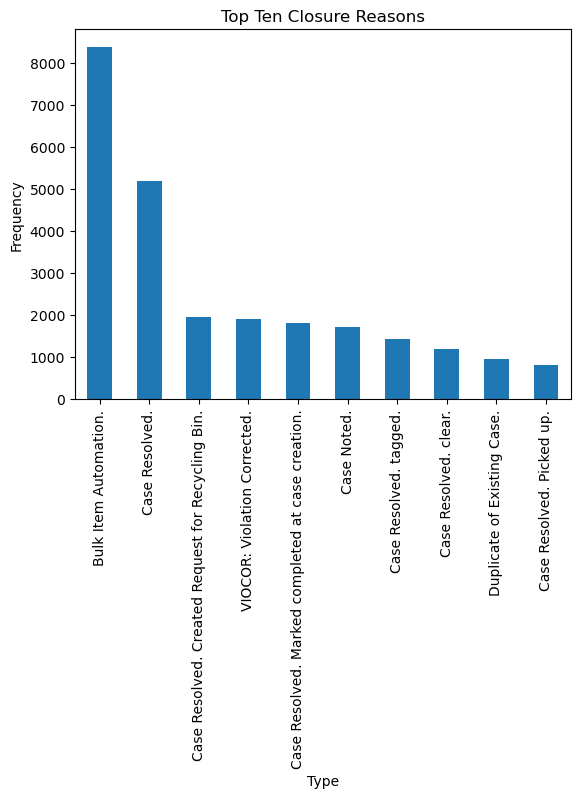

In [30]:
import matplotlib.pyplot as plt

# count the frequency of each type
counts = df['CLOSURE_REASON'].value_counts()

# extract the top ten types by frequency
top_types = counts[:10]

# plot a bar graph of the top ten types
top_types.plot(kind='bar')

# set the chart title and axis labels
plt.title('Top Ten Closure Reasons')
plt.xlabel('Type')
plt.ylabel('Frequency')

# show the chart
plt.show()

In [74]:
df_2020 = pd.read_csv("311 Cases with LEP, Closure Types, and Blocks.csv", low_memory=False)
df_2020.head()

,Unnamed: 0,CASE_ENQUIRY_ID,OPEN_DT,SUBJECT,REASON,TYPE,LOCATION,propid,SOURCE,X,...,GRAFFITI,TRASH,PRIVATENEGLECT,PUBLICDENIG,PROBLEM,CLOSED_DT,CLOSURE_REASON,BLOCK_ID,LEP_P,POP100_RE
0,0,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Abandoned Bicycle,Abandoned Bicycle,"70 Burbank St, Boston, MA 02115",A162736,Mobile Request,-71.08892,...,0,1,0,1,1,3/12/20,Case Noted. There was no bike at that location...,1002,0.679654,3003
1,1,1.010030e+11,1/1/20,Mayor's 24 Hour Hotline,Needle Program,Needle Pickup,"12 Stoneholm St, Boston, MA 02115",A130870,Mobile Request,-71.08863,...,0,0,0,0,0,1/2/20,"Case Resolved. Unable to access alleyway, plea...",2002,0.679654,3003
2,2,1.010030e+11,1/5/20,Property Management,Graffiti,Graffiti Removal,"57 Westland Ave, Boston, MA 02115",A148495,Mobile Request,-71.08818,...,1,0,0,1,1,9/9/20,NaN,1002,0.679654,3003
3,3,1.010030e+11,1/5/20,Mayor's 24 Hour Hotline,Needle Program,Needle Pickup,"36 Edgerly Rd, Boston, MA 02115",A51166,Mobile Request,-71.08757,...,0,0,0,0,0,1/5/20,Case Resolved. 2 syringes recovered from locat...,3001,0.679654,3003
4,4,1.010030e+11,1/5/20,Mayor's 24 Hour Hotline,Needle Program,Needle Pickup,"103 Norway St, Boston, MA 02115",A285282,Mobile Request,-71.08833,...,0,0,0,0,0,1/5/20,Case Resolved. 1 syringe recovered from locati...,2003,0.679654,3003


In [93]:
import matplotlib.pyplot as plt
import pandas as pd

# count the frequency of each type
df_l = pd.read_csv('df_l.csv', low_memory=False)
df_l.head()
df_ll = pd.merge(df_lep, df_l, on='LEP_P')
df_ll.head()
# counts.plot(kind='line',x='',y='LEP_P')
# plt.gca().invert_yaxis()
# plt.show()


,CT_ID_10,LEP_P,POP100_RE,LEP_R
0,25025981501,0.0,12,178
1,25025981202,0.0,207,178
2,25025981502,0.0,9,178
3,25025981000,0.0,22,178
